# Investigation on the Relationship Between Amount of Calories and Rating of Recipes

**Name(s)**: Baoyi Wan & Qinyuan Gu

**Website Link**: https://github.com/clytzechoo/DSC80_Final_Project/edit/main/README.md

In [1]:
import pandas as pd
import numpy as np
from scipy import stats
import plotly.figure_factory as ff
import plotly.express as px
from networkx.algorithms.traversal import dfs_successors
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, FunctionTransformer
from sklearn.linear_model import LinearRegression, Lasso
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import precision_score
import ast

pd.options.plotting.backend = 'plotly'

# from dsc80_utils import * # Feel free to uncomment and use this.

In [2]:
#!pip install tabulate

## Step 1: Introduction

Food is an essential part of our daily lives, and cooking serves as a hobby that brings joy and a sense of accomplishment to many. While numerous people are fond of fatty foods due to their delicious taste and the satisfaction they bring when eaten, this type of food, particularly those rich in saturated fat, contains more calories. The health risks associated with them, such as cardiovascular diseases, diabetes, and obesity, cannot be ignored. A Harvard University study published in JAMA Internal Medicine in 2016 showed that a long - term diet high in saturated fat is linked to a 2 - fold increased risk of coronary artery calcification. Another study in Diabetes Care in 2019 found that when consuming more than 1,000 calories per day for five days, insulin sensitivity decreased by 27%.
With this knowledge in mind, we aim to explore the relationship between the rating of a recipe and the amount of calories and saturated fat in it. Our goal is to predict the average rating of a recipe and understand its connection with the calories and saturated fat content in recipes. To achieve this, we are analyzing two datasets that include recipes and ratings posted on food.com since 2008.

The first dataset, **recipes**, contains 83782 rows, indicating 83782 unique recipes, with 10 columns. 

The second dataset, **interactions**, contains 731927 rows and each row contains a review from the user on a specific recipe.

we are investigating whether people rate high calorie recipes and the common calorie recipes on the same scale. To facilitate the investigation of our question, we separated the values in the **'nutrition'** columns into the corresponding columns, **'calories (#)', 'total fat (PDV)', 'sugar (PDV)', scurated fat (PDV)**, etc. PDV, or percent daily value shows how much a nutrient in a serving of food contributes to a total daily diet. Moreover, we calculated the proportion of sacurated fat in terms of calories out of the total calories of a given recipe and stored the information in a new column, **'prop sacurated fat'**. because high scureated fat in here will be referring to the recipes with value **'prop_sugar'** higher than the average 'prop_sugar'. The most relevant columns to answer our question are **'calories(#)', 'scureated fat (PDV)', 'prop scurated fat'**, described above, **'rating'**, which is the rating that user gave on a recipe, and **'avg_rating'**, which are the average of the ratings on each unique recipes.

Our research could lead to future work on diving deeper into how much awareness people have on the negative health effects of high colorie recipes.

In [3]:
# Load data
recipes = pd.read_csv('RAW_recipes.csv')
interactions = pd.read_csv('interactions.csv')

## Step 2: Data Cleaning and Exploratory Data Analysis

we conducted the following data cleaning steps:

  1. Left merge **'recipes', 'interactions'** two datasets.
  2. Replace 0 rating to np.nan.
  3. Get average rating for each recipe and add avg_rating to recipes dataset.
  4. Retrieve data from **nutrition** list-like string.
  5. Seperate values for research to series: **calories, total fat, protein, sacurated fat, carbohydrates**.
     
      We applied a **lambda** function then converted the columns to floats.
  6. Add **'prop scurated fat'** to the dataframe.
     
      prop sacurated fat is the proportion of sacurated fat of the total calories in a recipe. We use the values in the **scurated fat (PDV)** column to divide by 100% to get it in the decimal form. Then, we multiply by 20 to convert the values to grams of sacurated fat since 20 grams of scurated fat is the 100% daily value (PDV). We got this value of 20 grams from experimenting on food.com with different amounts of scurated fat in a recipe. The experimentation allows us to understand the nutrition formula used on the website for recipes. Lastly, we multiply by 9 since there are 9 calories in 1 gram of sugar. After all these conversions, we end up with the number of calories of scurated fat, so we can divide by the total amount of calories in the recipe to get the proportion of scurated fat of the total calories. It is convenient to show the values will be between 0 and 1.
  7. Add **'is_high_sacurated_fat'** to the dataframe.

      'is_high_sacurated_fat' is a boolean column checking if proportion of sacurated fat lager than 10% of calories. This step separates the recipes into two groups, ones that are high sacurated fat and ones that are not.
  8. Add **'is_high_calorie'** to the dataframe.

      'is_high_calorie' is a boolean column checking if calories of recipe more than 600. This step separates the recipes into two groups, ones that are high calorie and ones that are not.
  9. Add **'is_vegan'** to the dataframe.

      'is_vegan' is a boolean column checking if **'vegan'** is in tags of recpie. This step separates the recipes into two groups, ones that are vegan and ones that are not.
  10. Add **'is_quick'** to the dataframe.

      'is_quick' is a boolean column checking if **'quick'** is in tags of recpie. This step separates the recipes into two groups, ones that are quick and ones that are not.

In [4]:
# Data Cleaning
# left merge two datasets
result = pd.merge(recipes, interactions, left_on='id', right_on='recipe_id', how='left')
# replace 0 rating to np.nan
result['rating'] = result['rating'].replace(0, np.nan)
# get average rating for each recipe
avg_ratings = result.groupby('id')['rating'].mean().rename('avg_rating')
# add avg_rating to recipes dataset
recipes = recipes.merge(avg_ratings, left_on='id', right_index=True, how='left')
# retrieve data from nutrition list like string
recipes['nutrition'] = recipes['nutrition'].apply(ast.literal_eval)
# need values for research:calories, total fat, protein, sacurated fat, carbohydrates
recipes['calories'] = recipes['nutrition'].apply(lambda x: x[0] if isinstance(x, list) and x[0] > 0 else np.nan)
recipes['total fat'] = recipes['nutrition'].apply(lambda x: x[1] if isinstance(x, list) and x[1] > 0 else np.nan)
recipes['protein'] = recipes['nutrition'].apply(lambda x: x[4] if isinstance(x, list) and x[4] > 0 else np.nan)
recipes['sacurated fat'] = recipes['nutrition'].apply(lambda x: x[5] if isinstance(x, list) and x[5] > 0 else np.nan)
recipes['carbs'] = recipes['nutrition'].apply(lambda x: x[6] if isinstance(x, list) and x[6] > 0 else np.nan)
recipes['prop sacurated fat'] = recipes['nutrition'].apply(lambda x: x[5]/100*20*9/x[0] if isinstance(x, list)
                                and x[5] > 0 else np.nan)
recipes['is_high_calorie'] = recipes['nutrition'].apply(lambda x: True if isinstance(x, list) and x[0] > 600
else False)
recipes['is_high_sacurated_fat'] = recipes['prop sacurated fat'].apply(lambda x: True if x > 0.1 else False)
recipes['is_vegan'] = recipes['tags'].str.contains('vegan', na=False)
recipes['is_quick'] = recipes['tags'].str.contains('quick', na=False)

In [5]:
recipes # this dataframe will be the dataset for research

,name,id,minutes,contributor_id,submitted,tags,nutrition,n_steps,steps,description,...,calories,total fat,protein,sacurated fat,carbs,prop sacurated fat,is_high_calorie,is_high_sacurated_fat,is_vegan,is_quick
0,1 brownies in the world best ever,333281,40,985201,2008-10-27,"['60-minutes-or-less', 'time-to-make', 'course...","[138.4, 10.0, 50.0, 3.0, 3.0, 19.0, 6.0]",10,['heat the oven to 350f and arrange the rack i...,"these are the most; chocolatey, moist, rich, d...",...,138.4,10.0,3.0,19.0,6.0,0.247110,False,True,False,False
1,1 in canada chocolate chip cookies,453467,45,1848091,2011-04-11,"['60-minutes-or-less', 'time-to-make', 'cuisin...","[595.1, 46.0, 211.0, 22.0, 13.0, 51.0, 26.0]",12,"['pre-heat oven the 350 degrees f', 'in a mixi...",this is the recipe that we use at my school ca...,...,595.1,46.0,13.0,51.0,26.0,0.154260,False,True,False,False
2,412 broccoli casserole,306168,40,50969,2008-05-30,"['60-minutes-or-less', 'time-to-make', 'course...","[194.8, 20.0, 6.0, 32.0, 22.0, 36.0, 3.0]",6,"['preheat oven to 350 degrees', 'spray a 2 qua...",since there are already 411 recipes for brocco...,...,194.8,20.0,22.0,36.0,3.0,0.332649,False,True,False,False
3,millionaire pound cake,286009,120,461724,2008-02-12,"['time-to-make', 'course', 'cuisine', 'prepara...","[878.3, 63.0, 326.0, 13.0, 20.0, 123.0, 39.0]",7,"['freheat the oven to 300 degrees', 'grease a ...",why a millionaire pound cake? because it's su...,...,878.3,63.0,20.0,123.0,39.0,0.252078,True,True,False,False
4,2000 meatloaf,475785,90,2202916,2012-03-06,"['time-to-make', 'course', 'main-ingredient', ...","[267.0, 30.0, 12.0, 12.0, 29.0, 48.0, 2.0]",17,"['pan fry bacon , and set aside on a paper tow...","ready, set, cook! special edition contest entr...",...,267.0,30.0,29.0,48.0,2.0,0.323596,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83777,zydeco soup,486161,60,227978,2012-08-29,"['ham', '60-minutes-or-less', 'time-to-make', ...","[415.2, 26.0, 34.0, 26.0, 44.0, 21.0, 15.0]",7,"['heat oil in a 4-quart dutch oven', 'add cele...",this is a delicious soup that i originally fou...,...,415.2,26.0,44.0,21.0,15.0,0.091040,False,False,False,False
83778,zydeco spice mix,493372,5,1500678,2013-01-09,"['15-minutes-or-less', 'time-to-make', 'course...","[14.8, 0.0, 2.0, 58.0, 1.0, 0.0, 1.0]",1,['mix all ingredients together thoroughly'],this spice mix will make your taste buds dance!,...,14.8,NaN,1.0,NaN,1.0,NaN,False,False,True,False
83779,zydeco ya ya deviled eggs,308080,40,37779,2008-06-07,"['60-minutes-or-less', 'time-to-make', 'course...","[59.2, 6.0, 2.0, 3.0, 6.0, 5.0, 0.0]",7,"['in a bowl , combine the mashed yolks and may...","deviled eggs, cajun-style",...,59.2,6.0,6.0,5.0,NaN,0.152027,False,True,False,False
83780,cookies by design cookies on a stick,298512,29,506822,2008-04-15,"['30-minutes-or-less', 'time-to-make', 'course...","[188.0, 11.0, 57.0, 11.0, 7.0, 21.0, 9.0]",9,['place melted butter in a large mixing bowl a...,"i've heard of the 'cookies by design' company,...",...,188.0,11.0,7.0,21.0,9.0,0.201064,False,True,False,False


### Univariate Analysis

In this analysis, we first examined the distribution of calories in a recipe. The distribution histogram(fig1) shows that rapid decreasing trend to the right, indicating that most of the recipes in the dataframe have a relative low calories, indicating that as the calories in recipes gets higher, there are less of those recipes in the dataframe.

We then examined the distribution of average rating of recipes with different calories. The distribution scatter(fig2) shows that most rating accumulated around 3 to 5 stars. It seems that people like to give a relative high rating to the recipe. The more calories in one recipe, the higher rating people will give. That is interesting.

We also examined the distribution of proportion of scurated fat in a recipe. The histogram(fig3) shows that  5% - 15% scurated fat recipes got most number. With increasing of proportion of scurated fat, the number of recipes decreased rapidly.

We examined the distruibution of proportion of sacurated fat with average rating of recipes(fig4). The result is similar with fig2 but more concentrated 4 - 5 stars.


In [6]:
# Univariate Analysis
# fig1: Distribution of Calories in Recipes
fig1 = px.histogram(recipes, x='calories', nbins=50, title='Distribution of Calories in Recipes')
fig1.update_layout(xaxis_title='Calories', yaxis_title='Count')
fig1.show()

# fig2: Distribution of rating in recipes
interactions['rating'] = interactions['rating'].replace(0, np.nan)

avg_ratings = interactions.groupby('recipe_id')['rating'].mean().reset_index()
avg_ratings.columns = ['id', 'avg_rating']

fig2 = px.scatter(recipes, x='calories', y='avg_rating', 
                  title='Calories vs. Average Recipe Rating',
                  labels={'calories': 'Calories', 'avg_rating': 'Average Rating'},
                  opacity=0.5)
fig2.show()


# fig3: Distribution of Proportion of Sacurated Fat in Recipes
fig3 = px.histogram(recipes, x='prop sacurated fat', nbins=10, title='Distribution of Proportion of '
                                'Sacurated Fat in Recipes')
fig3.update_layout(xaxis_title='Proportion of Sacurated Fat in Recipe', yaxis_title='Count')
fig3.show()

# fig4: Proportion of Sacurated fat vs. Average Recipe Rating
fig4 = px.scatter(recipes, x='prop sacurated fat', y='avg_rating',
                  title='Proportion of Sacurated fat vs. Average Recipe Rating',
                  labels={'prop sacurated fat': 'Proportion of Sacurated fat', 'avg_rating': 'Average Rating'},
                  opacity=0.5)
fig4.show()

# fig5: Average Rating by Number of Recipe Steps 
grouped_table = recipes.groupby('n_steps')['avg_rating'].mean().reset_index().sort_values('n_steps')

print(grouped_table.head(10).to_markdown(index=False))

fig5 = px.bar(grouped_table, x='n_steps', y='avg_rating', 
              title='Average Rating by Number of Recipe Steps',
              labels={'n_steps': 'Number of Steps', 'avg_rating': 'Average Rating'})
fig5.show()

|   n_steps |   avg_rating |
|----------:|-------------:|
|         1 |      4.64813 |
|         2 |      4.66612 |
|         3 |      4.65546 |
|         4 |      4.64004 |
|         5 |      4.61038 |
|         6 |      4.61137 |
|         7 |      4.62251 |
|         8 |      4.62609 |
|         9 |      4.61521 |
|        10 |      4.60389 |


### Bivariate Analysis

In this analysis, we first split dataframe to two group. One is High Calories(calories value greater than 600), another is Common Calories. The compare histogram shows that the number of rating to high calories are much less than common group. But the trendency of rating stars is increasing. most number of rating in 4 - 5 stars.

We then do the similar thing, split dataframe to two group. One is High sacurated fat(is_high_scurated_fat is Ture), another is Common group. The compare bar shows that the number of rating to high sacurated fat are more than common group. The trendency of rating stars is increasing. most number of rating in 4 - 5 stars. So that means: high calories are not equal to high sacurated fat. High calories recipes are more complex.

In [7]:
# Bivariate Analysis
recipes['rating_rounded'] = recipes['avg_rating'].dropna().round().astype(int)
recipes['rating_rounded'] = recipes['rating_rounded'].clip(1, 5)
df_plot1 = recipes.groupby(['is_high_calorie', 'rating_rounded']).size().reset_index(name='count')
df_plot2 = recipes.groupby(['is_high_sacurated_fat', 'rating_rounded']).size().reset_index(name='count')

fig = px.bar(
    df_plot1,
    x='rating_rounded',
    y='count',
    color='is_high_calorie',
    barmode='group',
    title='High Calories vs Common Calories',
    labels={'rating_rounded': 'Rating', 'count': 'Count'},
    category_orders={'avg_rating': [1, 2, 3, 4, 5],
                     'is_high_calorie': [True, False]},
)

fig.show()

fig = px.bar(
    df_plot2,
    x='count',
    y='rating_rounded',
    color='is_high_sacurated_fat',
    barmode='group',
    orientation='h',
    title='High Sacurated Fat vs Common recipes',
    labels={'rating_rounded': 'Rating', 'count': 'Count'},
    category_orders={'avg_rating': [1, 2, 3, 4, 5],
                     'is_high_sacurated_fat': [True, False]},
)

fig.show()


### Interesting Aggregates

In this analysis, we investigated the relationship between the cooking time in minutes and calories of the recipes. We identified the outliers using the IQR method. After grouping the cooking time and calories in a pivot table shown below, we created a data visualization to understand it better.

The graph shows that as the cooking time increases the calories in a recipe fluctuates more and more. The shapes of the line for mean and median looks very similar, especially for the recipes with shorter cooking time.

In [8]:
# identified the outliers using the IQR
Q1, Q3 = recipes['calories'].quantile([0.25, 0.75])
IQR = Q3 - Q1
filter_df = recipes.query('(@Q1 - 1.5*@IQR) <= calories <= (@Q3 + 1.5*@IQR)')

agg_df = filter_df.groupby('minutes', as_index=False).agg(
    mean_cal=('calories', 'mean'),
    median_cal=('calories', 'median'),
    min_cal=('calories', 'min'),
    max_cal=('calories', 'max'),
    recipe_count=('calories', 'count')
).query('recipe_count > 3')

fig = px.line(
    agg_df,
    x='minutes',
    y=['mean_cal', 'median_cal', 'min_cal', 'max_cal'],
    labels={'value': 'Total Calories', 'variable': 'Statistic'},
    title='Recipe Calories vs Cooking Time',
    template='plotly_white',
    color_discrete_sequence=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
)

print(agg_df.head(10).round(1).to_markdown(index=False))
fig.show()


|   minutes |   mean_cal |   median_cal |   min_cal |   max_cal |   recipe_count |
|----------:|-----------:|-------------:|----------:|----------:|---------------:|
|         1 |      162.3 |        133.2 |       1.1 |     645.4 |            225 |
|         2 |      185.6 |        143.7 |       0.1 |     982.9 |            887 |
|         3 |      204.8 |        163.7 |       1.1 |     930.6 |            466 |
|         4 |      247.3 |        194.6 |       0.8 |     971.1 |            254 |
|         5 |      219.7 |        165.1 |       0.1 |     988.4 |           3599 |
|         6 |      228.2 |        173.6 |       0.8 |     938.5 |            318 |
|         7 |      265.6 |        220.6 |       1.2 |     954.5 |            379 |
|         8 |      253.9 |        199.8 |       0.1 |     930.5 |            315 |
|         9 |      280.5 |        230   |      14.6 |     956.5 |            108 |
|        10 |      244.1 |        189.5 |       0.1 |     982.5 |           4018 |


## Step 3: Assessment of Missingness


### NMAR Analysis


In [9]:
recipes['total fat'].count() - recipes['sacurated fat'].count()

np.int64(1056)


Comparing with the avaiable 'total fat' and 'sacruated fat', we found that there are about 1000 missing value in 'sacurated fat' column. We supposed that people submitting the recipe thought that 'total fat' is a essential information for a recipe, but 'sacureate fat' is NOT. On the other hand, we noticed that values for 'sacurated fat' always larger than 'total fat' according to most recipes. So the author of the recipe reluctant to submit sacurated fat figure. We believe that the missingness of the **'sacurated fat'** column is **NMAR**.

## Missingness Dependency

We are investigating whether the missiness in the **'avg_rating'** column depends on the column **'prop sacurated fat'**, which is the proportion of sacurated fat out of the total calories, or the column **'calories'**, which is the figure of calorie of the recipe.

#### Proportion of Sacurated Fat and Average Rating

**Null Hypothesis:** The missingness of ratings does not depend on the proportion of sacurate fat in the recipe.

**Alternate Hypothesis:** The missingness of ratings does depend on the proportion of sacurate fat in the recipe.

**Test Statistic:** The absolute difference of mean in the proportion of sacurate fat of the distribution of the group without missing ratings and the distribution of the group without missing ratings.

**Significance Level:** 0.05

We ran a permutation test by shuffling the missingness of rating for 1000 times to collect 1000 simulating mean differences in the two distributions as described in the test statistic.

In [10]:
# Assessment of Missingness
def plot_permutation_test_histogram(observed_diffs, observed_stat, test_column):
    fig = px.histogram(x=observed_diffs,
                       nbins=50,
                       title=f'Permutation Test for {test_column.replace("_", " ").title()}',
                       labels={'x': 'Absolute Mean Difference', 'y': 'Probability'},
                       histnorm='percent',
                       )
    # Add vertical line for observed statistic
    fig.add_vline(x=observed_stat, line_width=2, line_dash="dash", line_color="red",
                  annotation_text=f'Observed: {observed_stat:.4f}',
                  annotation_position="top right")

    fig.update_layout(
        showlegend=True,
        xaxis_title='Absolute Mean Difference',
        yaxis_title='Probability',
        hovermode='x'
    )

    return fig

def test_missingness_dependency_plotly(df, test_column, missing_column='avg_rating'):
    df = df.copy()
    df['missing'] = df[missing_column].isna()

    # Split into two groups
    present = df[~df['missing']][test_column].dropna()
    missing = df[df['missing']][test_column].dropna()

    # draw compare scatter plot
    fig = ff.create_distplot(
        hist_data=[present, missing],
        group_labels=['True', 'False'],
        show_rug=False, show_hist=False
    )
    fig.update_layout(title=f'{test_column} by Missingness of Rating')
    fig.show()

    observed_stat = np.abs(present.mean() - missing.mean())
    # Permutation test
    observed_diffs = []
    n_permutations = 1000
    combined = df[test_column].dropna().values
    for _ in range(n_permutations):
        np.random.shuffle(combined)
        perm_present_mean = np.mean(combined[:len(present)])
        perm_missing_mean = np.mean(combined[len(present):])
        diff = np.abs(perm_present_mean - perm_missing_mean)
        observed_diffs.append(diff)

    observed_diffs = np.array(observed_diffs)
    observed_diffs = observed_diffs[~np.isnan(observed_diffs)]


    # Calculate p-value
    p_value = (np.sum(observed_diffs >= observed_stat) + 1) / (len(observed_diffs) + 1)
    fig = plot_permutation_test_histogram(observed_diffs, observed_stat, test_column)

    return {
        'test_column': test_column,
        'present_mean': present.mean(),
        'missing_mean': missing.mean(),
        'observed_statistic': observed_stat,
        'p_value': p_value,
        'conclusion': 'Reject null' if p_value < 0.05 else 'Fail to reject null',
        'figure': fig
    }


# Test for prop sacurated fat
result_sacurated_fat = test_missingness_dependency_plotly(recipes, 'prop sacurated fat')
print("Sacurated Fat Proportion Results:")
print(f"Present mean: {result_sacurated_fat['present_mean']:.6f}")
print(f"Missing mean: {result_sacurated_fat['missing_mean']:.6f}")
print(f"Observed statistic: {result_sacurated_fat['observed_statistic']:.6f}")
print(f"P-value: {result_sacurated_fat['p_value']:.6f}")
print(f"Conclusion: {result_sacurated_fat['conclusion']}")
result_sacurated_fat['figure'].show()

Sacurated Fat Proportion Results:
Present mean: 0.164344
Missing mean: 0.170520
Observed statistic: 0.006176
P-value: 0.015984
Conclusion: Reject null



The observed statistic of 0.0062 is indicated by the red vertical dotted line on the graph. Since the p_value that we found (0.009990) is < 0.05 which is the significance level that we set, we **reject the null hypothesis**. The missingness of 'avg_rating' does depend on the 'prop sacurated fat', which is proportion of sacurated fat in the recipe.



#### Calories and Average Rating

**Null Hypothesis:** The missingness of ratings does not depend on the calories of the recipe.

**Alternate Hypothesis:** The missingness of ratings does depend on the calories of the recipe.

**Test Statistic:** The absolute difference of mean in calories of the recipe of the distribution of the group without missing ratings and the distribution of the group without missing ratings.

**Significance Level:** 0.05

In [11]:
# Test for calories
result_steps = test_missingness_dependency_plotly(recipes, 'calories')
print("\nValue of Calories Results:")
print(f"Present mean: {result_steps['present_mean']:.6f}")
print(f"Missing mean: {result_steps['missing_mean']:.6f}")
print(f"Observed statistic: {result_steps['observed_statistic']:.6f}")
print(f"P-value: {result_steps['p_value']:.6f}")
print(f"Conclusion: {result_steps['conclusion']}")
result_steps['figure'].show()


Value of Calories Results:
Present mean: 427.327895
Missing mean: 515.050326
Observed statistic: 87.722431
P-value: 0.000999
Conclusion: Reject null



The observed statistic of 87.7224 is indicated by the red vertical dotted line on the graph. Since the p_value that we found (0.000999) is < 0.05 which is the significance level that we set, we **reject the null hypothesis**. The missingness of 'avg_rating' does depend on the 'calories', which is calorie figure in the recipe.

## Step 4: Hypothesis Testing

we are interesting about whether people rate high sacurated fat recipes and common or low sacurated fat recipes on the same scale. By high sacurated fat recipes, we are talking about recipes with a proportion of sacurated fat higher than the average proportion of sacurated fat. At bivariate analysis part above, We noticed that rating number for high sacurated fat are much more than common sacurated fat. In this project, we split data into two group. One group is high sacurated fat recipes which the proportion of sacurated fat out of the total calories is greater than 10%. We use 'is_high_sacurated_fat' boolean column as investigating column associated with 'avg_rating'.

we ran a permutation test with the following hypotheses, test statistic, and significance level.

**Null Hypothesis:** People rate all the recipes on the same scale.

**Alternative Hypothesis:** People rate high sacurated fat recipes higher than common or low sacurated fat ones.

**Test Statistic:** The difference in mean between rating of high sacurated fat recipes higher than common or low sacurated fat ones.

**Significance Level:** 0.05

In [12]:
# Hypothesis Testing
def fat_rating_permutation_test(df, fat_col='is_high_sacurated_fat', rating_col='avg_rating', n_permutations=1000):
    df_clean = df[[fat_col, rating_col]].dropna()
    high_fat = df_clean[df_clean[fat_col]][rating_col]
    low_fat = df_clean[~df_clean[fat_col]][rating_col]
    observed_stat = high_fat.mean() - low_fat.mean()
    combined = df_clean[rating_col].values
    n_high_fat = len(high_fat)

    perm_diffs = []
    for _ in range(n_permutations):
        np.random.shuffle(combined)
        perm_high_fat_mean = combined[:n_high_fat].mean()
        perm_low_fat_mean = combined[n_high_fat:].mean()
        perm_diffs.append(perm_high_fat_mean - perm_low_fat_mean)
    p_value = (np.sum(perm_diffs >= observed_stat) + 1) / (len(perm_diffs) + 1)

    fig = px.histogram(x=perm_diffs,
               nbins=50,
               title='Distribution of Mean Difference in Rating (High-Fat - Common/low-Fat)',
               labels={'x': 'Mean Difference (High-Fat - Common/low-Fat)', 'y': 'frequency'},
               opacity=0.7)

    fig.add_vline(x=observed_stat, line_width=2, line_dash="dash", line_color="red",
                  annotation_text=f'Observed: {observed_stat:.4f}',
                  annotation_position="top right")

    fig.update_layout(
        showlegend=False,
        xaxis_title='Mean Difference (High-Fat - Common/low-Fat)',
        yaxis_title='Frequency',
        hovermode='x',
        annotations=[dict(text=f'p_value: {p_value:.4f}', x=0.05, y=0.95,
                          xref='paper', yref='paper', showarrow=False)]
    )

    return {
        'high_fat_mean': high_fat.mean(),
        'low_fat_mean': low_fat.mean(),
        'observed_statistic': observed_stat,
        'p_value': p_value,
        'n_high_fat': len(high_fat),
        'n_low_fat': len(low_fat),
        'conclusion': 'Reject null' if p_value < 0.05 else 'Can not reject null',
        'figure': fig
    }

results = fat_rating_permutation_test(recipes)
print(f"Sacurated Fat Recipes: {results['high_fat_mean']:.6f}")
print(f"Common Recipes: {results['low_fat_mean']:.6f}")
print(f"Observed statstics: {results['observed_statistic']:.6f}")
print(f"P_value: {results['p_value']:.6f}")
print(f"Conclusion: {results['conclusion']}")
print(f"High sacurated fat recipes: {results['n_high_fat']}")
print(f"Common or low sacurated fat recipes: {results['n_low_fat']}")
results['figure'].show()

Sacurated Fat Recipes: 4.631704
Common Recipes: 4.616107
Observed statstics: 0.015597
P_value: 0.000999
Conclusion: Reject null
High sacurated fat recipes: 48174
Common or low sacurated fat recipes: 32999


We shuffled the ratings for 1000 times to collect 1000 simulating mean differences in the two distributions as described in the test statistic. We got a p-value of 0.000999.

### Conclusion of Permutation Test

Since the p-value that we found is less than the significance level of 0.05, we **reject the null hypothesis**. People do not rate all the recipes on the same scale, and they tend to rate high sacurated fat recipes higher. That means that people are more concerned about flavor and energe supported by food other than health risks relating to sacurated fat recipes. This conclusion deserves the attention of administration of food.com.

## Step 5: Framing a Prediction Problem

We plan to predict average rating of a recipe which would be a regression problem since we can treat rating as float from 1 to 5. It is more reasonalbe to get a float average rating for most recpies other than an integer. 

**Prediction Type**: Regression

**Response Variable**: `avg_rating`

**Justification**: Understanding how recipe features relate to rating helps us infer what factors people prioritize when rating food (e.g. healthiness, prep time, etc.).

**Evaluation Metric**: R² (coefficient of determination)

**Why R²**: Since this is a regression problem and `avg_rating` is continuous, R² is suitable for measuring how well the model explains variability in recipe ratings.

**Note**: Only features that would be known *before* the recipe is published (e.g., not ratings) are used for training the model.



In [13]:

# --- (A) Data loading & basic feature extraction ---
recipes = pd.read_csv('RAW_recipes.csv')
interactions = pd.read_csv('interactions.csv')
# left merge two datasets

# Replace 0 ratings with NaN, then compute average rating per recipe
interactions['rating'] = interactions['rating'].replace(0, np.nan)
avg_ratings = (
    interactions
    .groupby('recipe_id')['rating']
    .mean()
    .reset_index()
    .rename(columns={'recipe_id': 'id', 'rating': 'avg_rating'})
)

recipes = recipes.merge(avg_ratings, on='id', how='inner')

# Boolean flags
recipes['is_vegan'] = recipes['tags'].str.contains('vegan', na=False)
recipes['is_quick'] = recipes['tags'].str.contains('quick', na=False)

# Parse nutrition list; positions: [0]=calories, [1]=total fat, [4]=protein, [6]=carbs (example)
recipes['nutrition'] = recipes['nutrition'].apply(ast.literal_eval)
recipes['calories'] = recipes['nutrition'].apply(lambda x: x[0] if isinstance(x, list) and len(x) > 0 else np.nan)
recipes['total fat'] = recipes['nutrition'].apply(lambda x: x[1] if isinstance(x, list) and len(x) > 1 else np.nan)
recipes['protein'] = recipes['nutrition'].apply(lambda x: x[4] if isinstance(x, list) and len(x) > 4 else np.nan)
recipes['carbs'] = recipes['nutrition'].apply(lambda x: x[6] if isinstance(x, list) and len(x) > 6 else np.nan)

# (Optional) If you want to vectorize ingredients:
# recipes['ingredients_joined'] = recipes['ingredients'].apply(lambda L: " ".join(L) if isinstance(L, list) else "")

model_data = recipes[
    ['minutes', 'n_steps', 'is_vegan', 'is_quick',
     'calories', 'total fat', 'protein', 'carbs',
     'avg_rating']
].copy()
model_data = model_data.dropna(subset=['avg_rating'])

X = model_data.drop(columns=['avg_rating'])
y = model_data['avg_rating']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42
)


# --- (B) Build preprocessing pipelines ---

numeric_features = ['minutes', 'n_steps', 'calories', 'total fat', 'protein', 'carbs']
bool_features    = ['is_quick']

# 1) Numeric pipeline: median imputation → standard scaling
numeric_transformer = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler()),
])

# 2) Boolean pipeline: cast to string so OneHotEncoder sees categories {"False","True"}
bool_to_str = FunctionTransformer(lambda X: X.astype(str), validate=False)
bool_transformer = Pipeline([
    ('bool2str', bool_to_str),
    ('onehot', OneHotEncoder(drop='if_binary', dtype=int, handle_unknown='ignore')),
])
preprocessor = ColumnTransformer(
    transformers=[
        ("num",  numeric_transformer, numeric_features),
        ("bool", bool_transformer, bool_features),
        # ("ingr", ingredient_vectorizer, ["ingredients_joined"]),
    ],
    remainder='drop'  # everything else (if any) is dropped
)


# Step 6: Baseline Model

We'll create a baseline regression model using a subset of the available features. Our goal is to predict `avg_rating` using features that are known before user reviews.

**Features Used**:
- `calories`: Quantitative
- `total fat`: Quantitative
- `is_vegan`: Nominal (Boolean)
- `is_quick`: Nominal (Boolean)

**Encoding & Preprocessing**:
- Numerical features are median-imputed and standardized.
- Boolean features are one-hot encoded.

We'll split the data into training and testing sets and evaluate the model using R². 

In [14]:
# --- (C) Baseline: LinearRegression pipeline ---

baseline_pipe = Pipeline([
    ('preproc', preprocessor),
    ('regressor', LinearRegression())
])

baseline_pipe.fit(X_train, y_train)
baseline_score = baseline_pipe.score(X_test, y_test)
print(f"Baseline LinearRegression R²: {baseline_score:.4f}")

Baseline LinearRegression R²: -0.0003



We got Baseline LinearRegression R² is -0.0003. To get more accurated prediction, we need to try another model.

## Step 7: Final Model

To improve on our baseline model, we add two new features and apply Lasso regression with hyperparameter tuning.

**New Features**:

prop sacurated fat: Proportion of saturated fat to total calories
n_steps: Number of preparation steps in the recipe
These features are informative:

prop sacurated fat relates to the nutritional density of the recipe.
n_steps reflects recipe complexity, which may affect user experience and ratings.
**Model Choice**: Lasso regression (for automatic feature selection)

Tuning: We'll perform a grid search over different alpha values for regularization.

**Evaluation Metric**: R² score on the test set.

In [15]:
# --- (D) Final: Lasso with hyperparameter tuning ---

lasso_pipe = Pipeline([
    ('preproc', preprocessor),
    ('lasso', Lasso(max_iter=20_000))
])

param_grid = {
    'lasso__alpha': [0.001, 0.01, 0.1, 1.0, 10.0]
}

grid = GridSearchCV(
    lasso_pipe,
    param_grid=param_grid,
    cv=5,
    scoring='r2',
    n_jobs=-1
)
grid.fit(X_train, y_train)

best_alpha = grid.best_params_['lasso__alpha']
final_score = grid.score(X_test, y_test)

print(f"Final Lasso R²: {final_score:.6f}  (best α = {best_alpha})")


Final Lasso R²: -0.000041  (best α = 0.001)



We got Final Lasso R² is -0.000041  (best α = 0.001). as will to drop some unuseless columns to make the result more accurate.

We dropped 'name','id','contributor_id','submitted','tags','steps','description','ingredients','nutrition' columns. Why we drop these columns because 'name','id','contributor_id', they are categorical data and are useless since we already perform the left merge for id and contributor_id and we do not focus on names of the food. We then drop 'steps', 'nutrition' since we already extract useful information from these columns such as number of steps and calories, total fat, saturated fat. Lastly, we drop columns that we are not interested in our study such as 'tags' ,'submitted', 'description', 'ingredients'.

So, we reconsturcted the dataframe and ran model again. 

In [16]:

# --- (A) Data loading & basic feature extraction ---
recipes = pd.read_csv('RAW_recipes.csv')
interactions = pd.read_csv('interactions.csv')
# left merge two datasets
result = pd.merge(recipes, interactions, left_on='id', right_on='recipe_id', how='left')
# replace 0 rating to np.nan

result['rating'] = result['rating'].replace(0, np.nan)
# get average rating for each recipe
avg_ratings = result.groupby('id')['rating'].mean().rename('avg_rating')
# add avg_rating to recipes dataset
recipes = recipes.merge(avg_ratings, left_on='id', right_index=True, how='left')
# retrieve data from nutrition list like string
recipes['nutrition'] = recipes['nutrition'].apply(ast.literal_eval)
# need values for research:calories, total fat, protein, sacurated fat, carbohydrates
recipes['calories'] = recipes['nutrition'].apply(lambda x: x[0] if isinstance(x, list) and x[0] > 0 else np.nan)
recipes['total fat'] = recipes['nutrition'].apply(lambda x: x[1] if isinstance(x, list) and x[1] > 0 else np.nan)
recipes['protein'] = recipes['nutrition'].apply(lambda x: x[4] if isinstance(x, list) and x[4] > 0 else np.nan)
recipes['saturated fat'] = recipes['nutrition'].apply(lambda x: x[5] if isinstance(x, list) and x[5] > 0 else np.nan)
recipes['carbs'] = recipes['nutrition'].apply(lambda x: x[6] if isinstance(x, list) and x[6] > 0 else np.nan)
recipes['prop saturated fat'] = recipes['nutrition'].apply(lambda x: x[5]/100*20*9/x[0] if isinstance(x, list)
                                and x[5] > 0 else np.nan)
recipes['is_high_calorie'] = recipes['nutrition'].apply(lambda x: True if isinstance(x, list) and x[0] > 600
else False)
recipes['is_high_saturated_fat'] = recipes['prop saturated fat'].apply(lambda x: True if x > 0.1 else False)
recipes['is_vegan'] = recipes['tags'].str.contains('vegan', na=False)
recipes['is_quick'] = recipes['tags'].str.contains('quick', na=False)

model_data = recipes[
    ['minutes', 'n_steps', 'is_vegan', 'is_quick',
     'calories', 'total fat', 'protein', 'carbs',
     'avg_rating','saturated fat','prop saturated fat','is_high_calorie','is_high_saturated_fat']
].copy()
model_data = model_data.dropna(subset=['avg_rating'])

X = model_data.drop(columns=['avg_rating'])
y = model_data['avg_rating']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42
)


# --- (B) Build preprocessing pipelines ---

numeric_features = ['n_steps', 'protein', 'carbs','prop saturated fat','minutes','calories','total fat'] #delete 'minutes','calories','total fat','n_ingredients'
bool_features    = ['is_vegan','is_quick','is_high_calorie','is_high_saturated_fat'] #'is_vegan'

# 1) Numeric pipeline: median imputation → standard scaling
numeric_transformer = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler()),
])

# 2) Boolean pipeline: cast to string so OneHotEncoder sees categories {"False","True"}
bool_to_str = FunctionTransformer(lambda X: X.astype(str), validate=False)
bool_transformer = Pipeline([
    ('bool2str', bool_to_str),
    ('onehot', OneHotEncoder(drop='if_binary', dtype=int, handle_unknown='ignore')),
])

preprocessor = ColumnTransformer(
    transformers=[
        ("num",  numeric_transformer, numeric_features),
        ("bool", bool_transformer, bool_features),
        # ("ingr", ingredient_vectorizer, ["ingredients_joined"]),
    ],
    remainder='drop'  # everything else (if any) is dropped
)


# --- (C) Baseline: LinearRegression pipeline ---

baseline_pipe = Pipeline([
    ('preproc', preprocessor),
    ('regressor', LinearRegression())
])

baseline_pipe.fit(X_train, y_train)
baseline_score = baseline_pipe.score(X_test, y_test)
print(f"Baseline LinearRegression R²: {baseline_score:.4f}")


# --- (D) Final: Lasso with hyperparameter tuning ---

lasso_pipe = Pipeline([
    ('preproc', preprocessor),
    ('lasso', Lasso(max_iter=20_000))
])

param_grid = {
    'lasso__alpha': [0.001, 0.01, 0.1, 1.0, 10.0]
}

grid = GridSearchCV(
    lasso_pipe,
    param_grid=param_grid,
    cv=5,
    scoring='r2',
    n_jobs=-1
)
grid.fit(X_train, y_train)

best_alpha = grid.best_params_['lasso__alpha']
final_score = grid.score(X_test, y_test)

print(f"Final Lasso R²: {final_score:.6f}  (best α = {best_alpha})")


Baseline LinearRegression R²: 0.0006
Final Lasso R²: 0.000099  (best α = 0.001)


In [17]:
recipes.columns

Index(['name', 'id', 'minutes', 'contributor_id', 'submitted', 'tags',
       'nutrition', 'n_steps', 'steps', 'description', 'ingredients',
       'n_ingredients', 'avg_rating', 'calories', 'total fat', 'protein',
       'saturated fat', 'carbs', 'prop saturated fat', 'is_high_calorie',
       'is_high_saturated_fat', 'is_vegan', 'is_quick'],
      dtype='object')

In [18]:
dfs=recipes.drop(['name','id','contributor_id','submitted','tags','steps','description','ingredients','nutrition'],axis=1) 
dfs #no n-steps, 

,minutes,n_steps,n_ingredients,avg_rating,calories,total fat,protein,saturated fat,carbs,prop saturated fat,is_high_calorie,is_high_saturated_fat,is_vegan,is_quick
0,40,10,9,4.0,138.4,10.0,3.0,19.0,6.0,0.247110,False,True,False,False
1,45,12,11,5.0,595.1,46.0,13.0,51.0,26.0,0.154260,False,True,False,False
2,40,6,9,5.0,194.8,20.0,22.0,36.0,3.0,0.332649,False,True,False,False
3,120,7,7,5.0,878.3,63.0,20.0,123.0,39.0,0.252078,True,True,False,False
4,90,17,13,5.0,267.0,30.0,29.0,48.0,2.0,0.323596,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83777,60,7,22,5.0,415.2,26.0,44.0,21.0,15.0,0.091040,False,False,False,False
83778,5,1,13,5.0,14.8,NaN,1.0,NaN,1.0,NaN,False,False,True,False
83779,40,7,8,5.0,59.2,6.0,6.0,5.0,NaN,0.152027,False,True,False,False
83780,29,9,10,1.0,188.0,11.0,7.0,21.0,9.0,0.201064,False,True,False,False


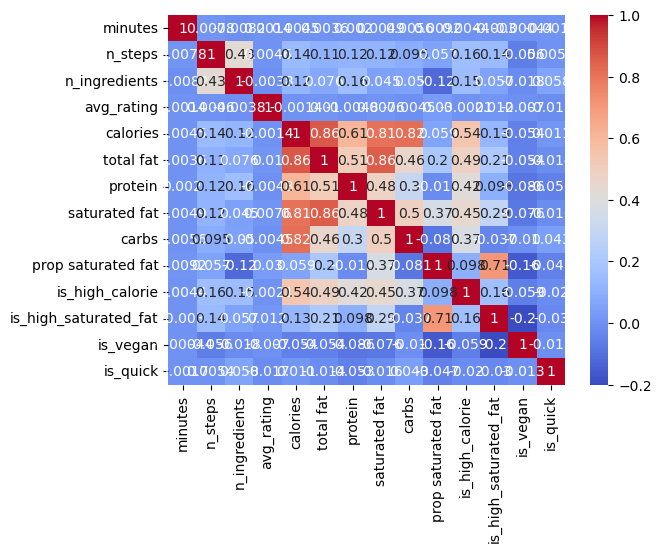

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt
correlation_matrix=dfs.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()

In [20]:
correlation_matrix

,minutes,n_steps,n_ingredients,avg_rating,calories,total fat,protein,saturated fat,carbs,prop saturated fat,is_high_calorie,is_high_saturated_fat,is_vegan,is_quick
minutes,1.000000,0.007812,-0.008204,0.001436,0.004530,0.003575,0.001973,0.004896,0.005577,0.009248,0.004441,-0.002976,-0.000441,-0.001703
n_steps,0.007812,1.000000,0.430158,0.004603,0.144200,0.106248,0.115211,0.117735,0.094552,0.056664,0.159903,0.144604,-0.056433,0.005396
n_ingredients,-0.008204,0.430158,1.000000,-0.003846,0.124034,0.076080,0.157879,0.045411,0.049537,-0.116194,0.152787,0.056948,-0.018309,0.057894
avg_rating,0.001436,0.004603,-0.003846,1.000000,-0.001384,0.010316,-0.004778,0.007625,-0.004522,0.029992,-0.002107,0.011956,-0.006958,-0.016690
calories,0.004530,0.144200,0.124034,-0.001384,1.000000,0.864394,0.607082,0.805517,0.817102,0.058666,0.541075,0.131677,-0.054466,0.010786
total fat,0.003575,0.106248,0.076080,0.010316,0.864394,1.000000,0.509770,0.859081,0.457102,0.203307,0.488539,0.211282,-0.054479,-0.014077
protein,0.001973,0.115211,0.157879,-0.004778,0.607082,0.509770,1.000000,0.478069,0.303767,-0.018933,0.418210,0.098263,-0.085727,-0.052880
saturated fat,0.004896,0.117735,0.045411,0.007625,0.805517,0.859081,0.478069,1.000000,0.496506,0.370017,0.446202,0.286664,-0.075544,-0.016100
carbs,0.005577,0.094552,0.049537,-0.004522,0.817102,0.457102,0.303767,0.496506,1.000000,-0.081265,0.373980,-0.037454,-0.010414,0.042791
prop saturated fat,0.009248,0.056664,-0.116194,0.029992,0.058666,0.203307,-0.018933,0.370017,-0.081265,1.000000,0.098194,0.707777,-0.159458,-0.046935




We got more precised and reasonable result after revise the final model.

## Step 8: Fairness Analysis

We will assess the fairness of our final model by comparing prediction performance across two groups:

**Group X**: Vegan recipes (`is_vegan == True`)

**Group Y**: Non-vegan recipes (`is_vegan == False`)

**Metric**: R² (coefficient of determination)

**Null Hypothesis (H₀)**: The model's R² is the same for vegan and non-vegan recipes; any difference is due to chance.

**Alternative Hypothesis (H₁)**: The model performs better for one group over the other (i.e., R² differs).

**Test Statistic**: Absolute difference in R² values between the two groups.

In [21]:
# Evaluate final model fairness across vegan vs non-vegan
X_test['is_vegan'] = X_test['is_vegan'].astype(bool)
group_vegan = X_test[X_test['is_vegan'] == True]
group_nonvegan = X_test[X_test['is_vegan'] == False]
y_pred = grid.predict(X_test)
y_pred = pd.Series(y_pred, index=X_test.index)

# R² by group
from sklearn.metrics import r2_score
r2_vegan = r2_score(y_test.loc[group_vegan.index], y_pred.loc[group_vegan.index])
r2_nonvegan = r2_score(y_test.loc[group_nonvegan.index], y_pred.loc[group_nonvegan.index])
observed_diff = abs(r2_vegan - r2_nonvegan)
print(f"R² for vegan recipes: {r2_vegan:.4f}")
print(f"R² for non-vegan recipes: {r2_nonvegan:.4f}")
print(f"Observed difference in R²: {observed_diff:.4f}")

R² for vegan recipes: -0.0006
R² for non-vegan recipes: 0.0001
Observed difference in R²: 0.0008


In [22]:
# Permutation test for fairness
diffs = []
for _ in range(1000):
    shuffled = X_test['is_vegan'].sample(frac=1, replace=False).reset_index(drop=True)
    group_A = X_test.copy()
    group_A['shuffled_is_vegan'] = shuffled
    idx_A = group_A[group_A['shuffled_is_vegan'] == True].index
    idx_B = group_A[group_A['shuffled_is_vegan'] == False].index
    r2_A = r2_score(y_test.loc[idx_A], y_pred.loc[idx_A])
    r2_B = r2_score(y_test.loc[idx_B], y_pred.loc[idx_B])
    diffs.append(abs(r2_A - r2_B))

p_val = np.mean(np.array(diffs) >= observed_diff)
print(f"Permutation test p-value for R² difference: {p_val:.4f}")

Permutation test p-value for R² difference: 0.9400


We found that difference of two different group is quite similar, so 